In [1]:
import numpy as np
import cv2
import traceback
from itertools import groupby
from matplotlib import gridspec
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import imutils
from imutils import perspective
import math
import pandas as pd
import statsmodels.formula.api as smf

calibration = False
try:
    from scripts import calibration
except:
    print("Can not import scripts")

####### Calibiration Code ########

ratio = [3.797585822140869,
 3.219780105037765,
 2.7502836427832986,
 1.7889954492725242,
 3.4443577065000537,
 4.838681791889408,
 2.306289106393861,
 2.378243456978054,
 2.9383486897535205,
 4.688115322164186,
 4.373077209218123,
 3.789786055780032,
 2.636556402197854,
 2.919668902552845,
 1.7852769636700667,
 2.321717374059108,
 3.22468307784103,
 3.809149404400353,
 0.9042703721085809,
 1.1992720111441206,
 1.2786583886477778,
 1.7191844184914222,
 5.579458707101586,
 2.8454161163557234,
 2.4656580160910786,
 0.9394702824526728,
 3.970996440048987,
 1.6586625576935723,
 1.147048000037325,
 1.1252320487945706,
 2.3647776478491087,
 4.370407552373325,
 5.530469468030706,
 2.846140299494055,
 4.368939406941635,
 4.059826020088069,
 2.721782670004265,
 3.9851474875432498,
 5.607753633881514,
 6.082326895188751,
 3.440600577653097,
 3.3169146232416686,
 2.5520536229289648,
 3.416822700977507,
 2.018541117472699,
 2.075559857216936,
 4.793365241789075,
 1.3727478907277286,
 5.395520327781036,
 5.026896797475021,
 3.1705045910580605,
 5.085426941340293]

dbh = [28.3,
 20.0,
 16.7,
 10.4,
 23.2,
 34.3,
 14.7,
 15.9,
 18.8,
 30.0,
 26.45,
 21.2,
 18.5,
 21.0,
 12.2,
 14.8,
 20.7,
 25.1,
 5.0,
 7.2,
 7.2,
 10.85,
 38.0,
 15.8,
 14.9,
 5.5,
 25.7,
 9.1,
 6.6,
 7.0,
 14.0,
 29.9,
 38.5,
 18.0,
 36.9,
 24.7,
 16.3,
 28.5,
 35.9,
 40.7,
 23.6,
 25.0,
 15.8,
 20.1,
 13.5,
 12.9,
 30.5,
 7.6,
 32.6,
 35.1,
 19.9,
 31.9]

calibiration_data = pd.DataFrame({
    "ratio": ratio,
    "measured_dbh": dbh
})

model = smf.ols('measured_dbh ~ ratio', data=calibiration_data)
model = model.fit()

# prediction function
def getPrediction(ratio):
    try:
        new_X = float(ratio)
        pred = model.predict({"ratio": new_X})
        return round(pred.tolist()[0],2)
    except:
        return None






# define pixel constants
trunk = [0,85,0]
#tag  = [100,150,255]
tag  = [255,150,100]
white = [255,255,255]
black = [0,0,0]

def getTreeMask(im):
    tree_im = im.copy()
    # Make background black
    tree_im[np.all(tree_im == white, axis=-1)] = black

    # make tag black
    tree_im[np.all(tree_im == tag, axis=-1)] = black

    # make trunk white
    tree_im[np.all(tree_im == trunk, axis=-1)] = white

    # return tree_mask
    return tree_im


def getTagMask(im):
    tag_im = im.copy()
    # Make background black
    tag_im[np.all(tag_im == white, axis=-1)] = black

    # make trunk black
    tag_im[np.all(tag_im == trunk, axis=-1)] = black

    # make tag white
    tag_im[np.all(tag_im == tag, axis=-1)] = white

    return tag_im

def getContour(mask):
    # get the edges
    edged = cv2.Canny(mask, 50, 100)

    # get the contours 
    contours,_ = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    return contours


def getTagContour(tag_contours):
    ''' 
    Find and return index of the tag contour with lagest perimeter
    '''

    #cv.arcLength(cnt,True)
    tag_perimeters = [cv2.arcLength(c, True) for c in tag_contours]

    return tag_perimeters.index(np.max(tag_perimeters))

def getPixelsPerMetricHelper(tag_contour, metric):

    ''' 
    Takes tag contour and return pixelsPerMetric base on X pixel, Y pixels widths
    '''

    # get miminumum box
    box = cv2.minAreaRect(tag_contour)
    (_,_), (w,_), _ = box

    # return 
    return w/metric


def getPixelPerMetric(seg_image, tag_width):
  try:
    tag_im = getTagMask(seg_image)
    tag_contours = getContour(tag_im)
    #print(tag_contours)
    return getPixelsPerMetricHelper(tag_contours[getTagContour(tag_contours)], tag_width)
  except:
    print(traceback.format_exc())
    return None


def find_continuous_indexes(lst, value):
    result = []
    start_index = None
    end_index = None
    for i in range(len(lst)):
        if lst[i].tolist() == value:
            if start_index is None:
                start_index = i
            end_index = i
        else:
            if start_index is not None:
                result.append((start_index, end_index))
                start_index = None
                end_index = None
    if start_index is not None:
        result.append((start_index, end_index))
    return result


def generateVisualization_TrueAnnotation_zoomed(seg_image, x,y, avg_tree_pixel_width, w , file, indexes, box, measured_dbh, predicted_dbh):
    #/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs
    output_path = f'/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs/overlay_TrueAnnotation_zoom_{file}.png'
    alpha = 0.6
    fig = plt.figure(figsize=(50, 20))
    grid_spec = gridspec.GridSpec(1, 3, width_ratios=[1, 1 , 1])


    # original image 
    mask_location = f'/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs/resized_zoomed_img_{file}.png' #'data/outputs/temp.png'
    mask1 = Image.open(mask_location)
    plt.subplot(grid_spec[0])
    plt.title(f'Original Image (Measured dbh = {measured_dbh})', fontdict = {'fontsize' : 30})
    plt.imshow(mask1)
    plt.axis('off')

    # original image with mask
    mask = seg_image
    plt.subplot(grid_spec[1])
    plt.title('Original Segmetation Mask', fontdict = {'fontsize' : 30})
    plt.imshow(mask1)
    plt.imshow(mask, alpha=alpha)
    plt.axis('off')


    # show mask ovelay on image with tag and trunk pixel widht estimations
    plt.subplot(grid_spec[2])
    plt.title(f'Pixel Width Overlay (Predicted dbh = {predicted_dbh})', fontdict = {'fontsize' : 30})
    DrawImage = ImageDraw.Draw(mask1)
    # draw tag width estimation
    DrawImage.line([(int(x-(w/2)), int(y+(w/2))),(int(x+(w/2)), int(y+(w/2)))], fill="red", width=5)
    # draw tree trunk width estimation

    # draw tag box
    (tl, tr, br, bl) = box
    DrawImage.line([tuple(tl), tuple(tr)], fill='blue', width=3)
    DrawImage.line([tuple(tr), tuple(br)], fill='blue', width=3)
    DrawImage.line([tuple(br), tuple(bl)], fill='blue', width=3)
    DrawImage.line([tuple(bl), tuple(tl)], fill='blue', width=3)

    tree_x1 = indexes[0]
    wt = avg_tree_pixel_width
    DrawImage.line([(tree_x1 , int(y-(w/2))),( tree_x1 + wt , int(y-(w/2)))], fill="red", width=5)
    plt.imshow(mask1)
    plt.imshow(seg_image, alpha=alpha)

    # save overlay images
    plt.savefig(output_path)

def generateVisualization_TrueAnnotation(seg_image, x,y, avg_tree_pixel_width, w , file, indexes, box, measured_dbh, predicted_dbh):
    #/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs
    output_path = f'/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs/overlay_TrueAnnotation_{file}.png'
    alpha = 0.6
    fig = plt.figure(figsize=(50, 20))
    grid_spec = gridspec.GridSpec(1, 3, width_ratios=[1, 1 , 1])


    # original image 
    mask_location = f'/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs/resized_original_{file}.png' #'data/outputs/temp.png'
    mask1 = Image.open(mask_location)
    plt.subplot(grid_spec[0])
    plt.title(f'Original Image (Measured dbh = {measured_dbh})', fontdict = {'fontsize' : 30})
    plt.imshow(mask1)
    plt.axis('off')

    # original image with mask
    #mask_location = f'/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/outputs/seg_image_original_{file}.png' #'data/outputs/temp.png'
    #mask = Image.open(mask_location)
    mask = seg_image
    plt.subplot(grid_spec[1])
    plt.title('Original Segmetation Mask', fontdict = {'fontsize' : 30})
    plt.imshow(mask1)
    plt.imshow(mask, alpha=alpha)
    plt.axis('off')


    # show mask ovelay on image with tag and trunk pixel widht estimations
    plt.subplot(grid_spec[2])
    plt.title(f'Pixel Width Overlay (Predicted dbh = {predicted_dbh})', fontdict = {'fontsize' : 30})
    DrawImage = ImageDraw.Draw(mask1)
    # draw tag width estimation
    DrawImage.line([(int(x-(w/2)), int(y+(w/2))),(int(x+(w/2)), int(y+(w/2)))], fill="red", width=5)
    # draw tree trunk width estimation

    # draw tag box
    (tl, tr, br, bl) = box
    DrawImage.line([tuple(tl), tuple(tr)], fill='blue', width=3)
    DrawImage.line([tuple(tr), tuple(br)], fill='blue', width=3)
    DrawImage.line([tuple(br), tuple(bl)], fill='blue', width=3)
    DrawImage.line([tuple(bl), tuple(tl)], fill='blue', width=3)

    tree_x1 = indexes[0]
    wt = avg_tree_pixel_width
    DrawImage.line([(tree_x1 , int(y-(w/2))),( tree_x1 + wt , int(y-(w/2)))], fill="red", width=5)
    plt.imshow(mask1)
    plt.imshow(seg_image, alpha=alpha)

    # save overlay images
    plt.savefig(output_path)

def generateVisualization(seg_image, x,y, avg_tree_pixel_width, w , file, indexes, box, measured_dbh, predicted_dbh):
    output_path = f'data/outputs/overlay_{file}.png'
    alpha = 0.6
    fig = plt.figure(figsize=(60, 20))
    grid_spec = gridspec.GridSpec(1, 5, width_ratios=[1, 1, 1, 1, 1])


    # original image 
    mask_location = 'data/outputs/resized_original_img_1.png' #'data/outputs/temp.png'
    mask1 = Image.open(mask_location)
    plt.subplot(grid_spec[0])
    plt.title(f'Original Image (Measured dbh = {measured_dbh})', fontdict = {'fontsize' : 30})
    plt.imshow(mask1)
    plt.axis('off')

    # original image with mask
    mask_location = 'data/outputs/seg_image_original_1.png' #'data/outputs/temp.png'
    mask = Image.open(mask_location)
    plt.subplot(grid_spec[1])
    plt.title('Original Segmetation Mask', fontdict = {'fontsize' : 30})
    plt.imshow(mask1)
    plt.imshow(mask, alpha=alpha)
    plt.axis('off')

    # show  resized image
    filename =  'data/outputs/resized_original_img.png' #'data/outputs/resized_img.png'
    img = Image.open(filename)
    plt.subplot(grid_spec[2])
    plt.title('Resized Image', fontdict = {'fontsize' : 30})
    plt.imshow(img)
    plt.axis('off')

    # show mask overlay image
    plt.subplot(grid_spec[3])
    plt.title('Segmentation Image Overlay', fontdict = {'fontsize' : 30})
    plt.imshow(img)
    plt.imshow(seg_image, alpha=alpha)
    plt.axis('off')

    # show mask ovelay on image with tag and trunk pixel widht estimations
    plt.subplot(grid_spec[4])
    plt.title(f'Pixel Width Overlay (Predicted dbh = {predicted_dbh})', fontdict = {'fontsize' : 30})
    DrawImage = ImageDraw.Draw(img)
    # draw tag width estimation
    DrawImage.line([(int(x-(w/2)), int(y+(w/2))),(int(x+(w/2)), int(y+(w/2)))], fill="red", width=5)
    # draw tree trunk width estimation

    # draw tag box
    (tl, tr, br, bl) = box
    DrawImage.line([tuple(tl), tuple(tr)], fill='blue', width=3)
    DrawImage.line([tuple(tr), tuple(br)], fill='blue', width=3)
    DrawImage.line([tuple(br), tuple(bl)], fill='blue', width=3)
    DrawImage.line([tuple(bl), tuple(tl)], fill='blue', width=3)

    tree_x1 = indexes[0]
    wt = avg_tree_pixel_width
    DrawImage.line([(tree_x1 , int(y-(w/2))),( tree_x1 + wt , int(y-(w/2)))], fill="red", width=5)
    plt.imshow(img)
    plt.imshow(seg_image, alpha=alpha)

    # save overlay images
    plt.savefig(output_path)

def getTreePixelLenght(y, seg_image, x):
    ''' 
    Takes cordinates for the top of the tag (y) and the middle of the tag (x on the x-axis) and return the pixel tree width at the row y-buffer. It also return the coordinates for the start and end of the tree pixels on the x-axis
    '''
    x = int(x)
    def getLength(indexes):
        return indexes[1] - indexes[0]

    try:
        #row = seg_image[y-buffer]
        row = seg_image[y]
        adjacent_trunks = find_continuous_indexes(row, trunk)
        #print(adjacent_trunks)
        for indexes in adjacent_trunks:
            if x in np.arange(indexes[0],indexes[1]):
                return [getLength(indexes), indexes]

        #print(adjacent_trunks)
        #return tag_adjacent_tree_pixel
        adjacent_trunks_length = [getLength(indexes) for indexes in adjacent_trunks]
        max_length = np.max(adjacent_trunks_length)
        #print(max_length)
        idx = adjacent_trunks_length.index(max_length)
        indexes = adjacent_trunks[idx]
        return [max_length,   indexes]
    except:
        #print(traceback.format_exc())
        return None

def getRangeTreePixelLengths(y1, y2, seg_image, x):

    ''' 
    Gets the average tree pixel width over a range of y values from y1 to y2, which intersects with the x 
    '''
    try:
        range_length = []
        indexes = []
        for i in np.arange(y1, y2):
            respond = getTreePixelLenght(i, seg_image, x)
            if respond != None:
                temp_lenth, temp_index = respond
                range_length.append(temp_lenth)
                indexes.append(temp_index)
            else:
                continue

        if len(range_length) != 0:
            tree_width =  np.mean(range_length)
            x_pixel = np.percentile([int(x) for (x,_) in indexes], 10)
            x2_pixel = np.percentile([int(x2) for (_,x2) in indexes],90)

            return [tree_width, (x_pixel, x2_pixel)]

    except:
        print(traceback.format_exc())
        return None


def getTagWidth(x1, y1, x2, y2, seg_image):
    """ 
    Takes the seg_image and the coordinates around it. Returns the numnber of tag pixel width
    """
    pixel_num = 0

    for y in np.arange(y1, y2):
        for x in np.arange(x1,x2):
            if seg_image[y][x].tolist() == tag:
                pixel_num +=1

    return math.sqrt(pixel_num)





def getTreePixelWidth(seg_image, file, measured_dbh, generate_viz):  
  #print(type(seg_image))
  try:
    
    y1 = y3 = 0; y2 = y4 = y = int(len(seg_image)/3) # use the average tree pixel length all over the image

    # can make this global and utilize aleady calculated one in the pixel estimation funciton
    tag_im = getTagMask(seg_image)
    tag_contours = getContour(tag_im)

    #print(tag_contours)

    c = tag_contours[getTagContour(tag_contours)] # get the main tag detection

    #print(c)

    box = cv2.minAreaRect(c)
    (x,y), (w,h), _ = box

    # determine y1, y2 - scenario 1 (best case tag is right in the middle of bottom of the image)
    box = cv2.cv.BoxPoints(box) if imutils.is_cv2() else cv2.boxPoints(box)
    box = np.array(box, dtype="int")
    y2 = np.min([int(y) for (_,y) in box.tolist()]) # find y cordintate for the tag position
    y1 = y2 - int(h)

    if y1 < 0: # if tag happens to be at the top of the image
        y1=y2

    y3 = np.max([int(y) for (_,y) in box.tolist()])
    y4 = y3  + int(h)

    if y4 > len(seg_image):
        y4 = y3

    # calculate pixel length for the tree
    if y1 ==y2: # average pixels below tag
        avg_tree_pixel_width = getRangeTreePixelLengths(y3,y4, seg_image, x)
    elif y3 == y4: # average pixels above tag
        avg_tree_pixel_width = getRangeTreePixelLengths(y1,y2, seg_image, x)
        #print(avg_tree_pixel_width)
    else:
        top_avg_tree_pixel_width = getRangeTreePixelLengths(y1,y2, seg_image, x)
        avg_tree_pixel_width = top_avg_tree_pixel_width

    if avg_tree_pixel_width == None:
        avg_tree_pixel_width = getTreePixelLenght(y2, seg_image, x) 

    tag_width = getTagWidth( max(int(x-w),0) , max(int(y-h),0), min(int(x+w),len(seg_image[0])), min(int(y+h),len(seg_image)), seg_image) # Search around the tag

    if calibration != False:
        predicted_dbh = calibration.getPrediction(avg_tree_pixel_width[0]/tag_width)
    else:
        predicted_dbh = getPrediction(avg_tree_pixel_width[0]/tag_width)
    
    if generate_viz == True:
        generateVisualization(seg_image, x,y, avg_tree_pixel_width[0] ,w, file, avg_tree_pixel_width[1], box, measured_dbh, predicted_dbh)
    elif generate_viz == 'Large':
        generateVisualization_TrueAnnotation(seg_image, x,y, avg_tree_pixel_width[0] ,w, file, avg_tree_pixel_width[1], box, measured_dbh, predicted_dbh)
    elif generate_viz == 'zoom':
        generateVisualization_TrueAnnotation_zoomed(seg_image, x,y, avg_tree_pixel_width[0] ,w, file, avg_tree_pixel_width[1], box, measured_dbh, predicted_dbh)
    
  
    return predicted_dbh

  except:
    print(traceback.format_exc())
    return None 



def getZoomCordinates(seg_image, buffer_pixels, resized_img, width, height):
    left = top = 0 ; right = len(seg_image[0]) ; bottom = len(seg_image) # initialize cordinates with sensible values

    # can make this global and utilize aleady calculated one in the pixel estimation funciton
    tag_im = getTagMask(seg_image)
    tag_contours = getContour(tag_im)

    c = tag_contours[getTagContour(tag_contours)]

    box = cv2.minAreaRect(c)
    (x,y), (w,h), _ = box

    # determine y1, y2 - scenario 1 (best case tag is right in the middle of bottom of the image)
    box = cv2.cv.BoxPoints(box) if imutils.is_cv2() else cv2.boxPoints(box)
    box = np.array(box, dtype="int")

    avg_tree_pixel_width = getRangeTreePixelLengths(0,len(seg_image), seg_image, x)

    ####### debugggin code #####
    #print(x,y)
    #print(w,h)
    #print(avg_tree_pixel_width)
    
    #box = perspective.order_points(box)
    left = max(avg_tree_pixel_width[1][0] - (w), left)  # ensure that it is not negative
    right = min(avg_tree_pixel_width[1][1] + (w), right)

    tag_top = int(y - (w/2)) ; tag_bottom =  int(y + (w/2))

    top = max(tag_top - (w * 2), top)  # ensure that it is not negative
    bottom = min( tag_bottom + (w * 2), bottom)

    # extrapolate coordinates for orignial image
    width_resized, height_resized = resized_img.size

    def getRelativePoint(left, resized_ref, actual_ref):
      return int((left/resized_ref) * actual_ref)

    left1 = getRelativePoint(left, width_resized, width); right1 = getRelativePoint(right, width_resized, width)
    top1 = getRelativePoint(top, height_resized, height); bottom1 = getRelativePoint(bottom, height_resized, height)

    ###### dedbugging ######
    #print(height, width)
    #print(len(seg_image), len(seg_image[0]))
    #print(left,top,right,bottom)
    #print(left1,top1,right1,bottom1)

    # ensure that image is portrait
    while right1 -left1 > bottom1 - top1:
        #bottom1 = bottom1 + (buffer_pixels *0.5)
        bottom1 = bottom1 + h

    return left1,top1,right1,bottom1 


TAG_PIXEL_THRESHOLD = 20
file = "/Users/edwardamoah/Documents/GitHub/tree_dbh_estimation/data/static/tag_pixels.txt"
def isTagInMask(seg_image):
    """ Takes a numpy array of an image and return True if the image has a tag pixel"""
    tag_pixel_count = 0
    for row in range(len(seg_image)):
        for pixel in seg_image[row]:
            if pixel.tolist() == tag:
                tag_pixel_count+=1
            else: 
                continue
    f = open(file, "a")
    f.write(f",{str(tag_pixel_count)}")
    f.close()
    if tag_pixel_count > TAG_PIXEL_THRESHOLD:
        return True
    return False


def isVertical(seg_image):
    """ Takes a numpy array of an image and return true if the tree in the image is vertical"""
    Y, X, a = np.where(seg_image == trunk)
    y_length = np.max(Y) - np.min(Y)
    x_length = np.max(X) - np.min(X)

    if (y_length/len(seg_image)) > x_length/len(seg_image[0]):
        return True
    return False


Can not import scripts


In [2]:
import numpy as np
from PIL import Image

# %tensorflow_version 1.x
import tensorflow.compat.v1 as tf

domain = 'tree_trunk'

path_to_model = '/Users/edwardamoah/Documents/GitHub/tree_semantic_segmentation/models/tree_trunk/tree_trunk_frozen_graph_1.4.pb'

large_to_model = '/Users/edwardamoah/Documents/GitHub/tree_semantic_segmentation/models/tree_trunk/tree_trunk_frozen_graph_1.3.pb'

#### load DeepLab Model #####
class DeepLabModel(object):
  """Class to load deeplab model and run inference."""

  INPUT_TENSOR_NAME = 'ImageTensor:0'
  OUTPUT_TENSOR_NAME = 'SemanticPredictions:0'
  INPUT_SIZE = 513

  def __init__(self, file_handle):
    """Creates and loads pretrained deeplab model."""
    self.graph = tf.Graph()
    graph_def = None

    graph_def = tf.GraphDef()
    with tf.gfile.GFile(file_handle, 'rb') as fid:
      serialized_graph = fid.read()
      graph_def.ParseFromString(serialized_graph)

    if graph_def is None:
      raise RuntimeError('Cannot find inference graph in tar archive.')

    with self.graph.as_default():
      tf.import_graph_def(graph_def, name='')

    self.sess = tf.Session(graph=self.graph)

  def run(self, image):
    """Runs inference on a single image.
    Args:
      image: A PIL.Image object, raw input image.
    Returns:
      resized_image: RGB image resized from original input image.
      seg_map: Segmentation map of `resized_image`.
    """
    width, height = image.size
    resize_ratio = 1.0 * self.INPUT_SIZE / max(width, height)
    target_size = (int(resize_ratio * width), int(resize_ratio * height))
    resized_image = image.convert('RGB').resize(target_size, Image.ANTIALIAS)
    batch_seg_map = self.sess.run(
        self.OUTPUT_TENSOR_NAME,
        feed_dict={self.INPUT_TENSOR_NAME: [np.asarray(resized_image)]})
    seg_map = batch_seg_map[0]
    return resized_image, seg_map


#MODEL = DeepLabModel(path_to_model) 

dbh_MODEL = DeepLabModel(path_to_model) 

zoom_MODEL = DeepLabModel(large_to_model) 


def create_tree_trunk_label_colormap():
  """Creates a label colormap for the locusts dataset.
  Returns:
    A Colormap for visualizing segmentation results.
  """
  colormap = np.zeros((4, 3), dtype=int)
  colormap[0] = [0,0,0]
  colormap[1] = [255,255,255]
  colormap[2] = [0,85,0]
  colormap[3] = [255,150,100]
  return colormap

def label_to_color_image(label, domain):
  """
  Adds color defined by the dataset colormap to the label.
  Args:
    label: A 2D array with integer type, storing the segmentation label.
    domain: A string specifying which label map to use
  Returns:
    result: A 2D array with floating type. The element of the array
      is the color indexed by the corresponding element in the input label
      to the PASCAL color map.
  Raises:
    ValueError: If label is not of rank 2 or its value is larger than color
      map maximum entry.
  """
  if label.ndim != 2:
    raise ValueError('Expect 2-D input label')
  elif domain == 'tree_trunk':
    colormap = create_tree_trunk_label_colormap()
  if np.max(label) >= len(colormap):
    raise ValueError('label value too large.')

  return colormap[label]


def get_label_names(domain):
  if domain == 'tree_trunk': #dumby labels
    LABEL_NAMES = np.asarray([ "Unlabeled", "Background", "Tree trunk", "Tag"
    ])
  else:
    LABEL_NAMES = 'error'

  return LABEL_NAMES

label_names = get_label_names(domain)
FULL_LABEL_MAP = np.arange(len(label_names)).reshape(len(label_names), 1)
FULL_COLOR_MAP = label_to_color_image(FULL_LABEL_MAP, domain)

Metal device set to: Apple M1 Max

systemMemory: 32.00 GB
maxCacheSize: 10.67 GB



2023-03-13 12:56:44.514339: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-03-13 12:56:44.515363: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-03-13 12:56:45.331623: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-03-13 12:56:45.331648: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL,

In [17]:
filename = "/Users/edwardamoah/Documents/GitHub/cetcil_data_analysis/cetcil/JupyterCode/data/static/tree_trunk/media/1675067575589.jpg"
im = Image.open(filename)
# run model 
resized_img , seg_map = dbh_MODEL.run(im)
seg_image = label_to_color_image(seg_map, domain).astype(np.uint8)

# check orientation of tree in image - 1
if not isVertical(seg_image): # if tree is not vertical in the image flip the image 
    print(f"Image is rotated {filename}")
    im = im.transpose(Image.ROTATE_270)
    im.save(filename)
    resized_img , seg_map = dbh_MODEL.run(im)
    seg_image = label_to_color_image(seg_map, domain).astype(np.uint8)

# get image dimension information
width, height = im.size


left,top,right,bottom = getZoomCordinates(seg_image, 100, resized_img, width, height)  

# crop and save zooomed image
zoomed_img = im.crop((left,top,right,bottom))
#zoomed_img.save(f'data/outputs/zoomed_img_{file}.png') 

Image is rotated /Users/edwardamoah/Documents/GitHub/cetcil_data_analysis/cetcil/JupyterCode/data/static/tree_trunk/media/1675067575589.jpg


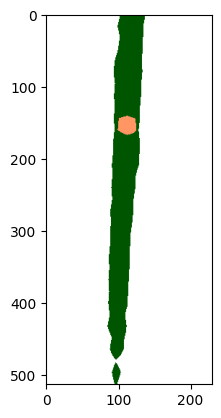

In [18]:
plt.imshow(seg_image)

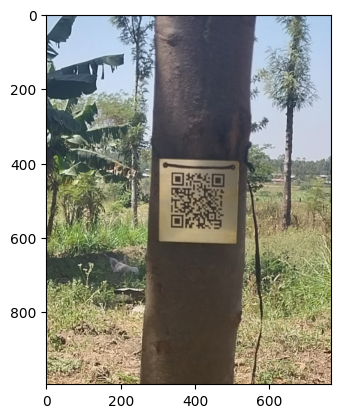

In [19]:
plt.imshow(zoomed_img)

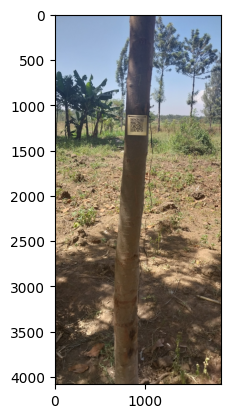

In [20]:
plt.imshow(im)

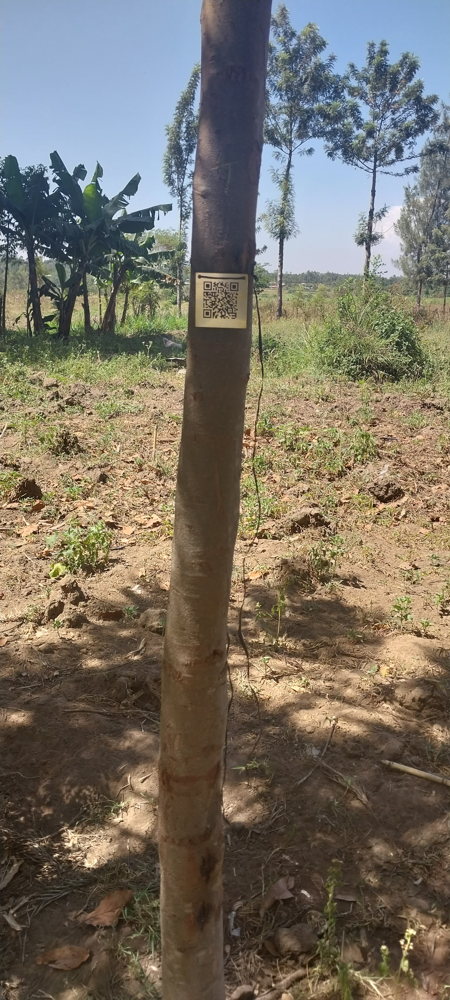

In [21]:
im

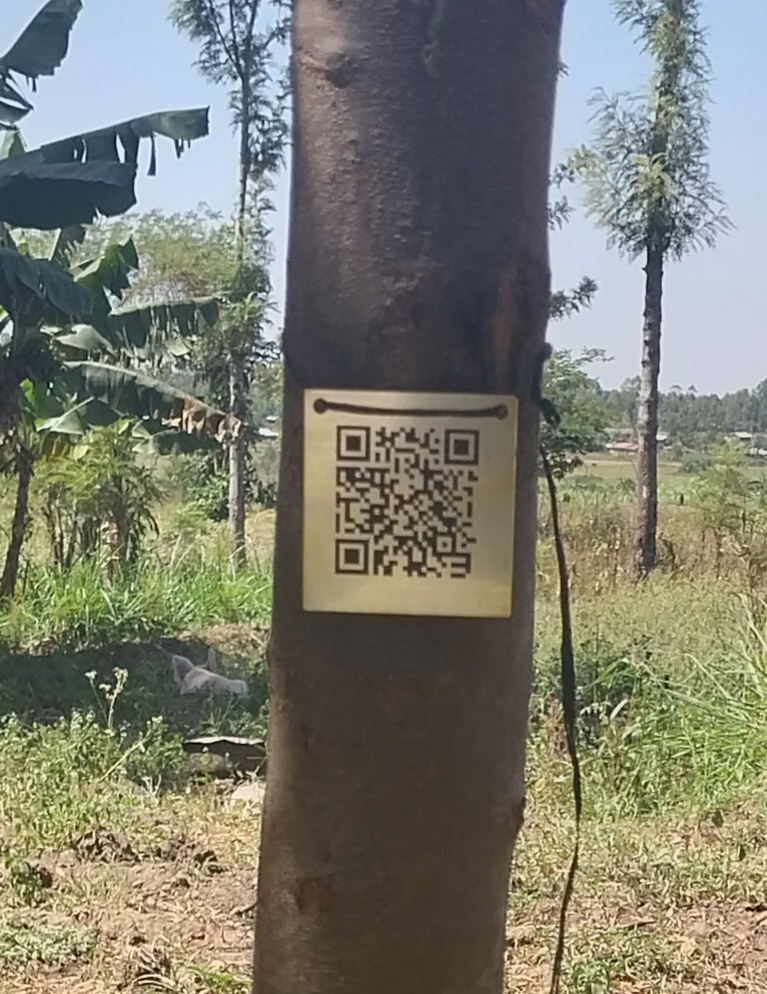

In [22]:
zoomed_img

In [1]:
# Country figure

USE_PYGEOS=1
# imports 
import json
import os
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import requests
import sys
from itertools import groupby
import datetime

# need this for cliping and so on to work
gpd.options.use_pygeos = True

/Users/edwardamoah/opt/anaconda3/envs/geoanalysis_env/lib/python3.10/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.11.0-CAPI-1.17.0). Conversions between both will be slow.
  warnings.warn(
/Users/edwardamoah/opt/anaconda3/envs/geoanalysis_env/lib/python3.10/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.11.0-CAPI-1.17.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
kenya = gpd.read_file("/Users/edwardamoah/Documents/GitHub/cetcil_data_analysis/cetcil/JupyterCode/data/static/kenyan-counties/County.shp")

<AxesSubplot: >

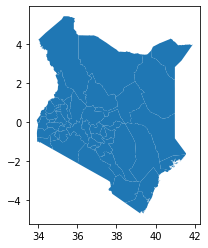

In [4]:
kenya.plot()

In [5]:
kenya.head()

,OBJECTID,AREA,PERIMETER,COUNTY3_,COUNTY3_ID,COUNTY,Shape_Leng,Shape_Area,geometry
0,1,5.677,15.047,2.0,1.0,Turkana,15.046838,5.676985,"POLYGON ((35.79593 5.34449, 35.79659 5.34468, ..."
1,2,6.177,11.974,3.0,2.0,Marsabit,11.974165,6.176831,"POLYGON ((36.05061 4.45622, 36.23184 4.45124, ..."
2,3,2.117,7.355,4.0,3.0,Mandera,7.355154,2.117196,"POLYGON ((41.62133 3.97673, 41.62272 3.97860, ..."
3,4,4.610,9.838,5.0,4.0,Wajir,9.838408,4.609589,"POLYGON ((39.31812 3.47197, 39.31956 3.47168, ..."
4,5,0.740,5.030,6.0,5.0,West Pokot,5.030271,0.740481,"POLYGON ((35.12745 2.62271, 35.12762 2.62302, ..."


In [7]:
data_counties = ["Bungoma", "Busia", "Kilifi"]
def getColor(county):
    if county in data_counties:
        return "black"
    return "white"

In [9]:
kenya['color'] = kenya.COUNTY.apply(getColor)

<AxesSubplot: >

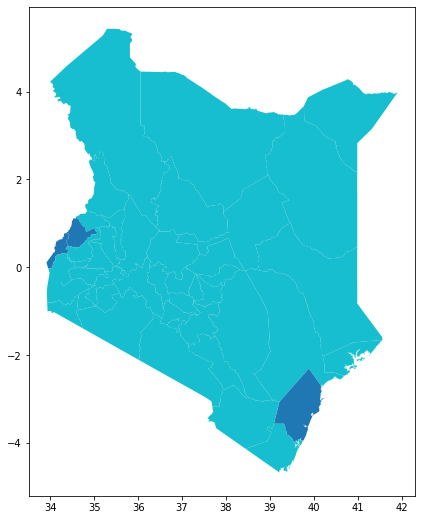

In [18]:
kenya.plot(column='color', figsize=(10,9))